# Modal Symbolic Learning: Day 2

## NATOPS: Interpretable gesture recognition

In [ ]:
using Pkg
Pkg.activate(".")
Pkg.instantiate()
Pkg.update()
Pkg.status()

  Activating project at `~/Desktop/modal-symbolic-learning-course`
    Updating registry at `~/.julia/registries/General`
    Updating git-repo `https://github.com/JuliaRegistries/General.git`
   Installed BenchmarkTools ───── v1.4.0
   Installed LoweredCodeUtils ─── v2.3.2
   Installed ModalDecisionTrees ─ v0.3.3
   Installed SoleLogics ───────── v0.6.11
   Installed SoleModels ───────── v0.5.3
    Updating `~/Desktop/modal-symbolic-learning-course/Project.toml`
  [e54bda2e] ↑ ModalDecisionTrees v0.3.2 ⇒ v0.3.3
  [b002da8f] ↑ SoleLogics v0.6.10 ⇒ v0.6.11
  [4249d9c7] ↑ SoleModels v0.5.2 ⇒ v0.5.3
    Updating `~/Desktop/modal-symbolic-learning-course/Manifest.toml`
  [6e4b80f9] ↑ BenchmarkTools v1.3.2 ⇒ v1.4.0
  [6f1432cf] ↑ LoweredCodeUtils v2.3.1 ⇒ v2.3.2
  [e54bda2e] ↑ ModalDecisionTrees v0.3.2 ⇒ v0.3.3
  [b002da8f] ↑ SoleLogics v0.6.10 ⇒ v0.6.11
  [4249d9c7] ↑ SoleModels v0.5.2 ⇒ v0.5.3
Precompiling project...
  ✓ BenchmarkTools
  ✓ LoweredCodeUtils
  ✓ Revise
  ✓ SoleLogics
  ✓ So

In [8]:
# Import libraries for statistics & Machine Learning
using Random
using DataFrames
using Plots
using StatsBase

using MLJ
using Sole

In [13]:
using JLD2
using DataFrames # (Maybe need version v1.6.1?)
JLD2.@load "COVID-dataset.jld2"
(X1_df, X2_df, y) = dataset;

In [9]:
countmap(y)

Dict{String, Int64} with 2 entries:
  "POSITIVE" => 91
  "NEGATIVE" => 106

In [21]:
using SoleData

X_multimodal = MultiModalDataset([X1_df, X2_df])

● MultiModalDataset{DataFrame}
   └─ dimensionalities: (1, 1)
- Modality 1 / 2
   └─ dimensionality: 1
197×30 SubDataFrame
 Row │ cough_F1                           cough_F2                           c ⋯
     │ SubArray…                          SubArray…                          S ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │ [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0…  [0.0658202, 0.0389503, 0.505408,…  [ ⋯
   2 │ [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0…  [1.62005, 0.648436, 0.248455, 0.…  [
   3 │ [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0…  [2.95991, 1.13398, 0.151934, 0.1…  [
   4 │ [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0…  [3.66094, 0.709991, 0.342895, 0.…  [
   5 │ [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0…  [1.26265, 0.966647, 0.281845, 0.…  [ ⋯
   6 │ [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0…  [4.12442, 2.09424, 0.267123, 0.1…  [
   7 │ [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0…  [3.42468, 1.26102, 0.164075, 0.0…  [
   8 │ [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0…  [10.8754, 0.646552, 0.395368, 0.…  

In [23]:
modality(X_multimodal, 1) # Cough modality

Row,cough_F1,cough_F2,cough_F3,cough_F4,cough_F5,cough_F6,cough_F7,cough_F8,cough_F9,cough_F10,cough_F11,cough_F12,cough_F13,cough_F14,cough_F15,cough_F16,cough_F17,cough_F18,cough_F19,cough_F20,cough_F21,cough_F22,cough_F23,cough_F24,cough_F25,cough_F26,cough_F27,cough_F28,cough_F29,cough_F30
,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…,SubArray…
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0658202, 0.0389503, 0.505408, 0.659653, 0.479911, 0.198311, 0.038341, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0130705, 0.00773471, 0.100364, 0.130993, 0.0953002, 0.0393805, 0.00761372, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.00454093, 0.00181044, 0.00463918, 0.00812784, 0.0114677, 0.00279443, 0.00452539, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.44294, 0.176597, 0.452524, 0.792822, 1.11861, 0.27258, 0.441425, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[1.35527, 0.337327, 2.38008, 3.41855, 1.53125, 2.44285, 1.16185, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[1.45399, 0.207212, 0.596481, 0.796232, 2.05163, 0.889234, 0.912046, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[8.8225, 4.00392, 3.61966, 3.75479, 5.86163, 7.57988, 21.0325, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[68.6091, 57.6602, 42.1623, 22.0087, 44.1134, 183.205, 231.173, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[324.805, 251.949, 146.992, 89.8209, 1076.5, 1405.0, 521.713, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[529.788, 319.674, 3170.16, 8754.94, 12131.5, 2635.83, 160.221, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[135.031, 65.4094, 31734.0, 45007.7, 9341.06, 356.08, 348.502, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[277.601, 149.644, 6192.97, 6410.55, 526.879, 1016.61, 3058.69, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[2463.94, 801.421, 218.482, 405.665, 5262.74, 5401.63, 1438.67, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[20281.1, 1322.6, 18382.4, 36321.8, 27790.6, 2262.41, 250.124, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[52706.7, 3379.9, 76705.7, 70649.4, 15600.4, 8659.85, 214.708, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[12469.4, 2027.9, 9573.34, 62751.8, 87979.5, 10106.8, 1175.91, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[5234.93, 3442.71, 27537.3, 49157.6, 34354.6, 7615.88, 590.886, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[10326.8, 8742.0, 29835.0, 65663.0, 37215.1, 9935.33, 1336.86, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[12937.2, 12652.3, 20925.7, 25481.2, 14228.1, 6209.21, 1830.89, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[15842.3, 11817.6, 20551.3, 66505.5, 53052.5, 15314.6, 4047.24, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[19539.8, 11725.6, 14110.9, 22741.0, 17571.2, 7866.31, 1784.98, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[7.47217e5, 2.85017e5, 1.91229e5, 161490.0, 74628.4, 5705.67, 230.46, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[2.82774e6, 1.12981e6, 6.8965e5, 5.55173e5, 2.28055e5, 11742.2, 526.767, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[1.8358e6, 8.47808e5, 3.64742e5, 3.14704e5, 1.72522e5, 31809.9, 4437.46, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[7.77569e5, 2.90888e5, 286646.0, 3.78292e5, 3.44293e5, 1.54095e5, 40524.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[4.94437e6, 1.92515e6, 9.28236e5, 2.59508e5, 68230.9, 40644.9, 7026.93, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[3.34059e6, 1.58093e6, 8.05443e5,

In [26]:
names(X1_df)

30-element Vector{String}:
 "cough_F1"
 "cough_F2"
 "cough_F3"
 "cough_F4"
 "cough_F5"
 "cough_F6"
 "cough_F7"
 "cough_F8"
 "cough_F9"
 "cough_F10"
 "cough_F11"
 "cough_F12"
 "cough_F13"
 ⋮
 "cough_F19"
 "cough_F20"
 "cough_F21"
 "cough_F22"
 "cough_F23"
 "cough_F24"
 "cough_F25"
 "cough_F26"
 "cough_F27"
 "cough_F28"
 "cough_F29"
 "cough_F30"

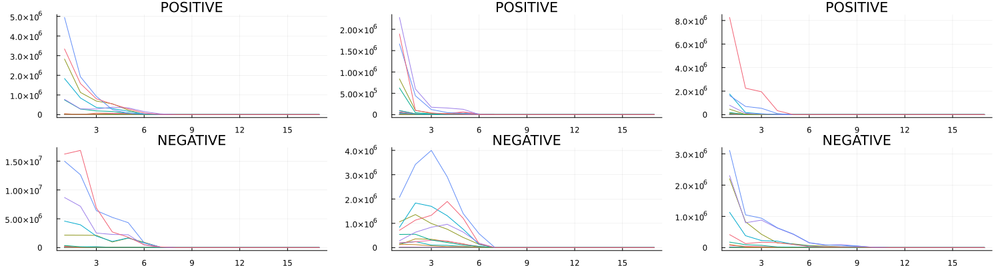

In [39]:
# Let's inspect some instances
plot(map(i->plot(collect(X1_df[i,:]), labels=nothing,title=y[i]), 1:35:(35*6))..., layout = (2, 3), size = (1500,400))

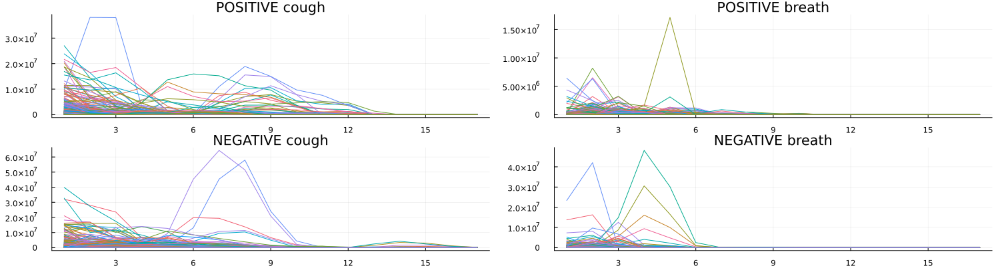

In [41]:
# All instances, grouped by class
plot(map((((X_mod, mod_name), _y),)->plot(collect.(eachrow(X_mod[findall(__y->__y == _y, y),:])), labels=nothing,title="$(_y) $(mod_name)"), Iterators.product(zip(eachmodality(X_multimodal), ["cough", "breath"]), unique(y)))..., layout = (2, 2), size = (1500,400))

In [72]:
using ModalDecisionTrees


untrained Machine; caches model-specific representations of data
  model: ModalDecisionTree(max_depth = nothing, …)
  args: 
    1:	Source @567 ⏎ Table{AbstractVector{AbstractVector{Continuous}}}
    2:	Source @759 ⏎ AbstractVector{Textual}


In [ ]:
# Train in cross-validation!
e = evaluate!(machine(ModalDecisionTree(; relations = :RCC8), X_multimodal, y);
        resampling=StratifiedCV(shuffle=true, nfolds = 3),
        measures=[accuracy],
        verbosity=0,
        check_measure=false
)

[ Info: Precomputing logiset...


In [ ]:
# Accuracies per fold
e.per_fold

In [71]:
e.report_per_fold[2].solemodel

▣ {1}(⟨G⟩(min[V31] ≥ 0.001853897887096119))
├✔ {1}(⟨G⟩((min[V31] ≥ 0.001853897887096119) ∧ ⟨A̅O̅⟩(min[V27] < 76685.17720224746)))
│├✔ {1}(⟨G⟩((min[V31] ≥ 0.001853897887096119) ∧ ⟨A̅O̅⟩((min[V27] < 76685.17720224746) ∧ (min[V28] < 44762.952262639636))))
││├✔ {1}(⟨G⟩((min[V31] ≥ 0.001853897887096119) ∧ ⟨A̅O̅⟩((min[V27] < 76685.17720224746) ∧ (min[V28] < 44762.952262639636) ∧ ⟨D̅B̅E̅⟩(min[V50] ≥ 1885.5712367271199))))
│││├✔ {1}(⟨G⟩((min[V31] ≥ 0.001853897887096119) ∧ ⟨A̅O̅⟩((min[V27] < 76685.17720224746) ∧ (min[V28] < 44762.952262639636) ∧ ⟨D̅B̅E̅⟩((min[V50] ≥ 1885.5712367271199) ∧ (min[V13] ≥ 1.400957923736261)))))
││││├✔ NEGATIVE
││││└✘ POSITIVE
│││└✘ NEGATIVE
││└✘ POSITIVE
│└✘ NEGATIVE
└✘ {1}(⟨G⟩(min[V27] ≥ 2.170219509362793e6))
 ├✔ {1}(⟨G⟩((min[V27] ≥ 2.170219509362793e6) ∧ ⟨G⟩(min[V46] ≥ 5838.390775457752)))
 │├✔ POSITIVE
 │└✘ {1}(⟨G⟩((min[V27] ≥ 2.170219509362793e6) ∧ (min[V19] ≥ 30000.48907253628)))
 │ ├✔ NEGATIVE
 │ └✘ {1}(⟨G⟩((min[V27] ≥ 2.170219509362793e6) ∧ (min[V21] < 20414.7

In [46]:
report(mach).solemodel

▣ {1}(⟨G⟩(min[V37] ≥ 0.0013205573259328035))
├✔ {1}(⟨G⟩((min[V37] ≥ 0.0013205573259328035) ∧ ⟨L̅⟩(min[V27] ≥ 226321.9912113276)))
│├✔ NEGATIVE
│└✘ {1}(⟨G⟩((min[V37] ≥ 0.0013205573259328035) ∧ (min[V48] ≥ 1242.1904769961468)))
│ ├✔ {1}(⟨G⟩((min[V37] ≥ 0.0013205573259328035) ∧ (min[V48] ≥ 1242.1904769961468) ∧ ⟨AO⟩(min[V40] ≥ 3.51978641624239)))
│ │├✔ {1}(⟨G⟩((min[V37] ≥ 0.0013205573259328035) ∧ (min[V48] ≥ 1242.1904769961468) ∧ ⟨AO⟩((min[V40] ≥ 3.51978641624239) ∧ ⟨AO⟩(min[V31] ≥ 1.6207745800042226e-5))))
│ ││├✔ POSITIVE
│ ││└✘ NEGATIVE
│ │└✘ POSITIVE
│ └✘ NEGATIVE
└✘ {1}(⟨G⟩(min[V27] ≥ 2.170219509362793e6))
 ├✔ {1}(⟨G⟩((min[V27] ≥ 2.170219509362793e6) ∧ ⟨G⟩(min[V46] ≥ 5838.390775457752)))
 │├✔ POSITIVE
 │└✘ {1}(⟨G⟩((min[V27] ≥ 2.170219509362793e6) ∧ (min[V30] < 1.6492884918659376e6)))
 │ ├✔ POSITIVE
 │ └✘ NEGATIVE
 └✘ {1}(⟨G⟩(min[V28] ≥ 672777.1743629333))
  ├✔ POSITIVE
  └✘ {1}(⟨G⟩(min[V30] ≥ 1.0114283593133552e6))
   ├✔ NEGATIVE
   └✘ POSITIVE



In [ ]:
X = scalarlogiset(X_df)
println(X)

In [ ]:
# Accessibles on multirelation frames
# Get the structure ("frame") of the first instance. It is a "dimensional" frame, of all interval from 1 to 51.
fr = SoleLogics.frame(X, 1)

In [ ]:
# Enumerate all worlds
collect(allworlds(fr))

In [ ]:
using SoleLogics: Interval
# Enumerate the intervals that are "Later" than [1,10]
accessibles(fr, Interval(1,10), IA_L) |> collect

In [ ]:
# Remember that features are computed on each world
# Let's compute the minimum of the first variable on an arbitrary interval, that is, "X[Hand tip l]".
feature = UnivariateMin(1)
Sole.featvalue(feature, X, 1, Interval(10,30))

In [ ]:
# Remember that atoms are *scalar conditions on features*
# Let's check one on an interval of the first instance
p = Atom(ScalarCondition(feature, >, -0.5))
check(p, X, 1, Interval(10,30))

In [ ]:
# I can check any formula
p = Atom(ScalarCondition(UnivariateMin(1), >, -0.5))
q = Atom(ScalarCondition(UnivariateMin(2), <=, 10))
φ = p ∨ q
check(φ, X, 1, Interval(10,30))

In [ ]:
# Generate a random HS formula with scalar conditions on features, and check it on the dataset.
features = [UnivariateMin(i_variable) for i_variable in 1:ncol(X_df)]
alpha = [Atom(ScalarCondition(feat, >, thresh)) for feat in features for thresh in 0:0.1:1]

HS_connectives = SoleLogics.diamondsandboxes(SoleLogics.IARelations)
propo_connectives = SoleLogics.BASE_PROPOSITIONAL_CONNECTIVES

println("Propositional connectives: $(join(syntaxstring.(propo_connectives), ", "))")
println("HS connectives: $(join(syntaxstring.(HS_connectives), ", "))")

propo_weights = fill(1/length(propo_connectives), length(propo_connectives))
HS_weights = fill(1/length(HS_connectives), length(HS_connectives))

connectives = vcat(propo_connectives, IA_connectives)

opweights = vcat(propo_weights, HS_weights)
    
treeheight = 3
φ2 = randformula(Random.MersenneTwister(30), treeheight, alpha, connectives; opweights = opweights)
println()
println("Random formula:")
println(syntaxstring(φ2))
        
check(φ2, X, 1, Interval(10,30))

In [ ]:
# Let's check a formula on all the instances
check_mask = check(φ2, X, Interval(10,30))

In [ ]:
# It holds on part of the instances
sum(check_mask)

In [ ]:
# Let's ask whether the formula holds *all* intervals, instead of checking it on [1,2]
println("Applying the universal global operator: ", SoleLogics.globalbox)
println()

universal_φ = globalbox(φ2)
println("Formula: ", syntaxstring(universal_φ))
check_mask = check(universal_φ, X)

# It holds on no instance... Too restrictive!
sum(check_mask)

In [ ]:
# Let's ask whether there exists any interval where the formula holds
println("Applying the existential global operator: ", SoleLogics.globaldiamond)
println()

existential_φ = globaldiamond(φ2)
println("Formula: ", syntaxstring(existential_φ))
check_mask = check(existential_φ, X)

# It holds on more instances
sum(check_mask)

In [ ]:
# Question: does it lead to a good rule?

println(syntaxstring(existential_φ))

println()
println(SoleLogics.experimentals.formula2natlang(existential_φ))

In [ ]:
neg_existential_φ = normalize(¬ existential_φ;
    profile = :readability,
    remove_implications = true,
    allow_atom_flipping = true
)

syntaxstring(neg_existential_φ; remove_redundant_parentheses = false)

In [ ]:
(SoleLogics.precedence(∧), SoleLogics.precedence(∨))

In [ ]:
countmap(y)

In [ ]:
println(existential_φ)
countmap(y[check_mask])

In [ ]:
println(neg_existential_φ)
countmap(y[(!).(check_mask)])

In [ ]:
branch = Branch(neg_existential_φ, "I have command", "Spread wings")

In [ ]:
y_preds = SoleModels.apply(branch, X)
println("Accuracy of this branch: $(sum(y .== y_preds)/length(y))")
println("Random chanc e: $(60/length(y))")

In [ ]:
println(X)

In [ ]:
# Randomly split the data: 20% training, 80% testing
N = nrow(X_df)
perm = randperm(Random.MersenneTwister(1), N)
train_idxs, test_idxs = perm[1:round(Int, N*.2)], perm[round(Int, N*.2)+1:end];
println("Using $(length(train_idxs)) instances for training")
println("Using $(length(test_idxs)) instances for testing")

In [ ]:
using ModalDecisionTrees

# Bind a machine learning algorithm to logiset & labels
mach = machine(ModalDecisionTree(; relations = :IA7, features = [minimum]), X_df, y)

# Train!
@time fit!(mach; rows=train_idxs);

# Compute accuracy
yhat = predict_mode(mach; rows=test_idxs)
MLJ.accuracy(yhat, y[test_idxs])

In [ ]:
# Show the restricted MDT learnt
printmodel(report(mach).rawmodel_full; hidemodality = true)

In [ ]:
# Show its *pure* version
printmodel(report(mach).solemodel_full; show_metrics = true, hidemodality = true)

In [ ]:
simplified_restricted_tree = ModalDecisionTrees.prune(report(mach).rawmodel_full; simplify = true)
printmodel(simplified_restricted_tree)

println()
println("# Leaves: ", nleaves(simplified_restricted_tree))

In [ ]:
solemodel = ModalDecisionTrees.translate(simplified_restricted_tree)

In [ ]:
# Print leaf rules + their training performances
ruleset = listrules(solemodel)
printmodel.(ruleset; show_metrics = true, threshold_digits = 2, variable_names_map = [names(X_df)],parenthesize_atoms = false, hidemodality = true);

In [ ]:
last_rule = ruleset[end]
last_antd = antecedent(last_rule)

println("First formula, translated:")
println(SoleLogics.experimentals.formula2natlang(last_antd; threshold_digits = 2, use_feature_abbreviations = true))
    

for (i_rule, rule) in enumerate(ruleset)
    println()
    println("[$i_rule]")
    antd = antecedent(rule)
    println(SoleLogics.experimentals.formula2natlang(antd; threshold_digits = 2, use_feature_abbreviations = true), "\n");
end

In [ ]:
# Print rules + their *test* performances

# Sprinkle the model with the test instances!
predictions, tree_test = report(mach).sprinkle(X_df[test_idxs,:], y[test_idxs]; simplify = true);

# Extract ruleset and print its metrics
ruleset_test = listrules(tree_test);

# printmodel.(ruleset_test; show_metrics = true, threshold_digits = 2, variable_names_map = [names(X_df)], parenthesize_atoms = true, hidemodality = true);
printmodel.(ruleset_test; show_metrics = true, threshold_digits = 2, parenthesize_atoms = false, hidemodality = true);

In [ ]:
println("IF\n\t", SoleLogics.experimentals.formula2natlang(antecedent(ruleset_test[4])))
println("THEN\n\t", consequent(ruleset_test[4]))

In [ ]:
# Obtain class rules & show their *test* metrics
condensed_ruleset_test = joinrules(ruleset_test)
printmodel.(condensed_ruleset_test; show_metrics = true, threshold_digits = 2, parenthesize_atoms = false, hidemodality = true);

# Exercise

`ModalDecisionTrees.jl` can also handle images! In which case, they use a 2D logic of rectangles instead of a 1D logic of intervals.

Apply ModalDecisionTrees to [Indian Pines](https://www.ehu.eus/ccwintco/index.php/Hyperspectral_Remote_Sensing_Scenes#Indian_Pines), a benchmark dataset for Land Cover Classification with 16 classes. The dataset consists of a hyperspectral image (i.e., 200 color channels instead of the typical 3 RGB channels) where many pixels have been labelled as belonging to one of the classes.

Sketch of the idea:
- Load the image and the ground truths. The package [MAT.jl](https://github.com/JuliaIO/MAT.jl/) can be helpful;
- From the $145 \times 145$ image provided, sample a (small) number $m$ of $3 \times 3$ patches for each class, and label each patch with the class label for the central pixel;
- Gather the ground truths into a vector of strings `y`, and the samples into a Julia `DataFrame` `X` with 200 columns, $16m$ rows and $3 \times 3$ *matrices* in the cells;
- Use MLJ to train a ModalDecisionTree on `X` and `y`, similarly to the above case.

Suggestion: since the formulas are desirably rotation-invariant, ask the algorithm to use *topological* relations instead of *directional* relations. Rrefer to the [doc](https://aclai-lab.github.io/ModalDecisionTrees.jl/) to know more.

<!-- Useful reference: Interpretable Land Cover Classification with Modal Decision Trees. European Journal of Remote Sensing. G. Pagliarini, G. Sciavicco. (in press) -->